In [53]:
import numpy as np
import myfuncs as mf
from matplotlib import pyplot as plt
import healpy as hp
from pixell import enmap, curvedsky

from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('svg')

# Imports

In [54]:
PROJECT = "/project/r/rbond/ymehta3/output/lensresponse/"
PROJECT_GERRIT = PROJECT + "gerrit/"
SCRATCH = '/scratch/r/rbond/ymehta3/output/lensresponse/'
SCRATCH_GERRIT = SCRATCH + "gerrit/"
PLOTDIR = SCRATCH 

In [56]:
sims_list = [100, 150, 200, 250, 300, 350, 400]
factor_list = [32, 64, 128]

### Response Function

In [55]:
R_gerr_100 = np.load(SCRATCH_GERRIT + 'harm_R2_100.npy')
R_gerr_150 = np.load(SCRATCH_GERRIT + 'harm_R2_150.npy')
R_gerr_200 = np.load(SCRATCH_GERRIT + 'harm_R2_200.npy')
R_gerr_250 = np.load(SCRATCH_GERRIT + 'harm_R2_250.npy')
R_gerr_300 = np.load(SCRATCH_GERRIT + 'harm_R2_300.npy')
R_gerr_350 = np.load(SCRATCH_GERRIT + 'harm_R2_350.npy')
R_gerr_400 = np.load(SCRATCH_GERRIT + 'harm_R2_400.npy')

R_gerr_list = [R_gerr_100, R_gerr_150, R_gerr_200, R_gerr_250, R_gerr_300, R_gerr_350, R_gerr_400]

R_v3 = np.load(PROJECT + 'v3/' + 'harm_R2.npy')

In [44]:
ellcut_32 = -int(32/2 + 1)
ellcut_64 = -int(64 + 1)
ellcut_128 = -int(128*0.75 + 1)

ellcut_list = [ellcut_32, ellcut_64, ellcut_128]

In [57]:
R_smooth_32_list = []
R_smooth_32_ellcut_list = []

for nsims in sims_list:
    R_smooth_32_list.append(np.load(SCRATCH_GERRIT + 'R2_smoothed_32_gerrit_' + str(nsims) + '.npy'))
    R_smooth_32_ellcut_list.append(R_smooth_32_list[-1][:ellcut_32, :])

In [58]:
R_smooth_64_list = []
R_smooth_64_ellcut_list = []

for nsims in sims_list:
    R_smooth_64_list.append(np.load(SCRATCH_GERRIT + 'R2_smoothed_64_gerrit_' + str(nsims) + '.npy'))
    R_smooth_64_ellcut_list.append(R_smooth_64_list[-1][:ellcut_64, :])    

In [59]:
R_smooth_128_list = []
R_smooth_128_ellcut_list = []

for nsims in sims_list:
    R_smooth_128_list.append(np.load(PROJECT_GERRIT + 'R2_smoothed_128_gerrit_' + str(nsims) + '.npy'))
    R_smooth_128_ellcut_list.append(R_smooth_128_list[-1][:ellcut_128, :])        

In [34]:
#Find the Ell Cuts
# R_smooth_32_list[0][:-int(32/2 + 1), 1000]
# R_smooth_64_list[0][:-int(64 + 1), 1000]
# R_smooth_128_list[0][:-int(128*0.75 + 1), 1000]

### Variance

In [9]:
var_32_list = []
var_64_list = []
var_128_list = []

for nsim in sims_list:
    var_32_list.append(np.load(PROJECT_GERRIT + 'okappa_var_32_' + str(nsim) + '.npy'))
    var_64_list.append(np.load(PROJECT_GERRIT + 'okappa_var_64_' + str(nsim) + '.npy'))
    var_128_list.append(np.load(PROJECT_GERRIT + 'okappa_var_128_' + str(nsim) + '.npy'))

# Response Function

## $\ell$, $m$ Space

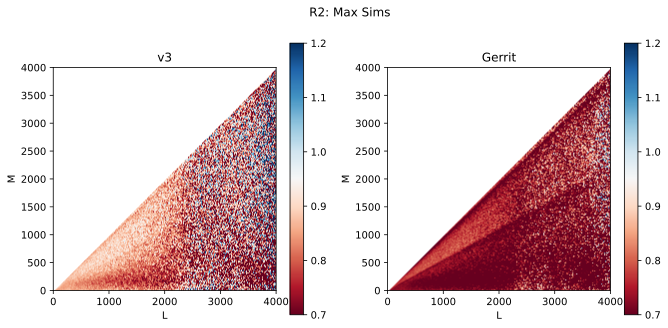

In [10]:
fig, ax = plt.subplots(1,2, figsize=(11,5))

cbar_range = [0.7, 1.2]

im = ax[0].imshow(np.transpose(R_v3), clim=cbar_range, cmap='RdBu', origin='lower')
ax[0].set_xlabel('L')
ax[0].set_ylabel('M')
ax[0].set_title('v3')
plt.colorbar(im, ax=ax[0])

im2 = ax[1].imshow(np.transpose(R_gerr_400), clim=cbar_range, cmap='RdBu', origin='lower')
ax[1].set_xlabel('L')
ax[1].set_ylabel('M')
ax[1].set_title('Gerrit')
plt.colorbar(im2, ax=ax[1]);

fig.suptitle('R2: Max Sims');

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

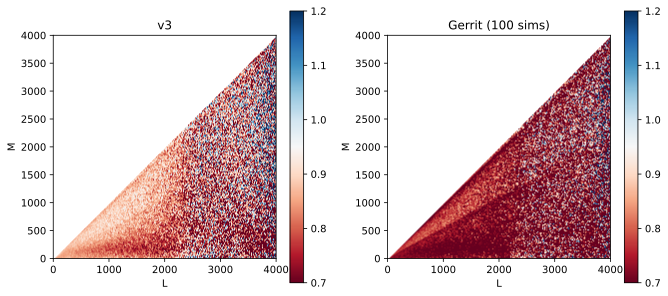

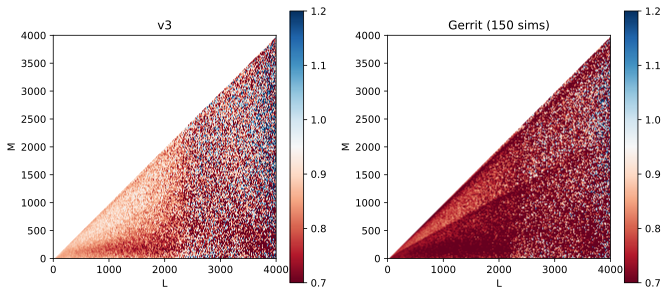

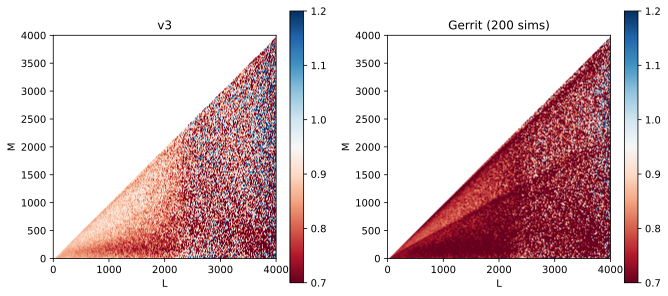

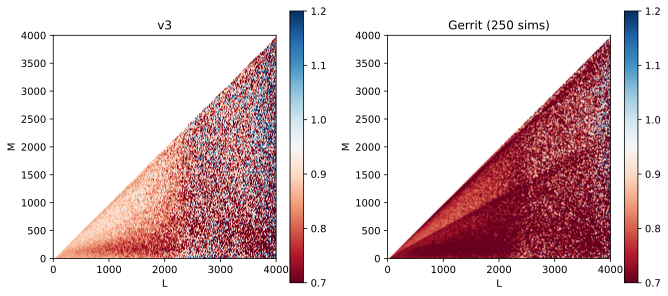

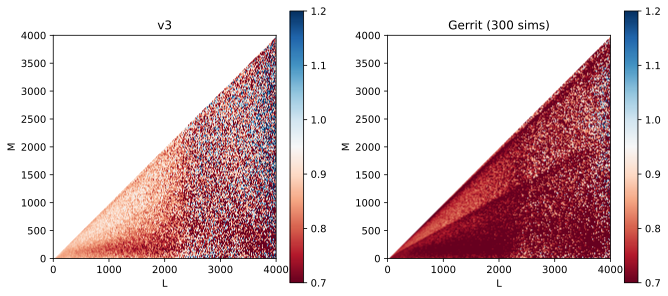

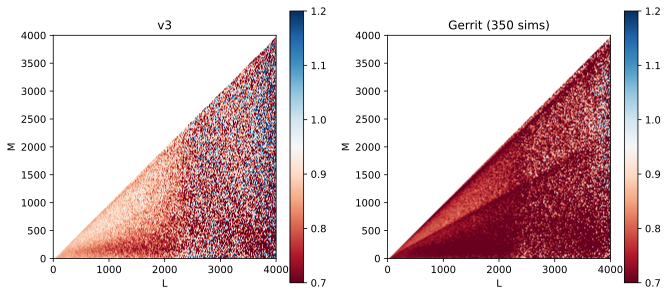

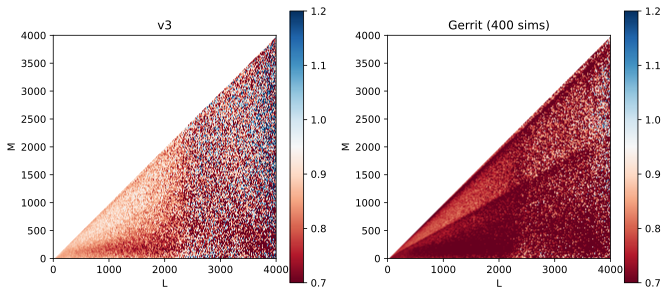

In [60]:
cbar_range = [0.7, 1.2]

for isim, R_gerr in zip(sims_list, R_gerr_list):
    fig, ax = plt.subplots(1,2, figsize=(11,5))

    im = ax[0].imshow(np.transpose(R_v3), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    ax[0].set_title('v3')
    plt.colorbar(im, ax=ax[0])

    im2 = ax[1].imshow(np.transpose(R_gerr), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[1].set_xlabel('L')
    ax[1].set_ylabel('M')
    ax[1].set_title(f'Gerrit ({isim} sims)')
    plt.colorbar(im2, ax=ax[1]);

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

Worryingly, the Gerrit and Frank sims are not agreeing for the same number of sims. More than that, the structure is always clearer in Gerrit's sims than they ever are in Frank's.

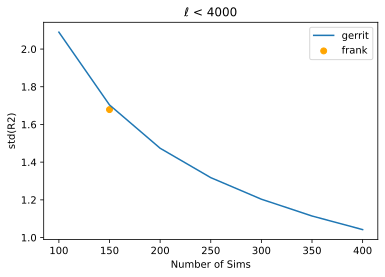

In [20]:
#Gerrit Noise
R_gerr_stds = []
for R_gerr in R_gerr_list:
    spread = np.nanstd(R_gerr)
    R_gerr_stds.append(spread)

#Frank Noise
R_v3_std = np.nanstd(R_v3)
    
#Plot
plt.plot(sims_list, R_gerr_stds, label='gerrit')
plt.scatter(150, R_v3_std, color='orange', label='frank')
plt.xlabel('Number of Sims')
plt.ylabel("std(R2)")
plt.title(r'$\ell$ < 4000')
plt.legend();

The noise for both is basically the same for the same number of sims (150 sims), although not exactly identical.

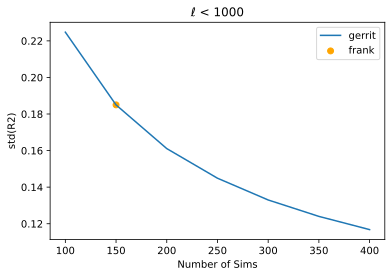

In [21]:
#Gerrit Noise
R_gerr_stds_subsec = []
for R_gerr in R_gerr_list:
    spread = np.nanstd(R_gerr[:1000, :1000])
    R_gerr_stds_subsec.append(spread)

#Frank Noise
R_v3_std = np.nanstd(R_v3[:1000, :1000])
    
#Plot
plt.plot(sims_list, R_gerr_stds_subsec, label='gerrit')
plt.scatter(150, R_v3_std, color='orange', label='frank')
plt.xlabel('Number of Sims')
plt.ylabel("std(R2)")
plt.title(r'$\ell$ < 1000')
plt.legend();

Downside: the standard deviation is higher for $\ell$ < 1000 by about 0.02. Upside: Frank and Gerrit's response functions' standard deviations agree.

This is probably just because there is more power loss in the lower ells than in the higher.

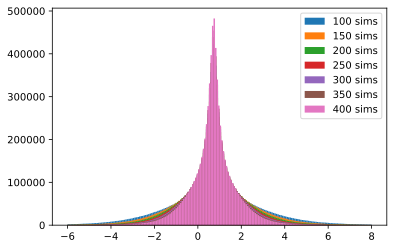

In [57]:
for isim, R_gerr in zip(sims_list, R_gerr_list):
    plt.hist(R_gerr[~np.isnan(R_gerr)], bins=200, range=[-6, 8], label=f'{isim} sims')
    plt.legend();

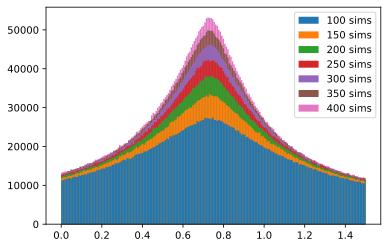

In [55]:
for isim, R_gerr in zip(sims_list, R_gerr_list):
    plt.hist(R_gerr[~np.isnan(R_gerr)], bins=200, range=[0, 1.5], label=f'{isim} sims', zorder= -isim)
    
    plt.legend();

The overall response function is indeed getting less noisy though. 

In [13]:
np.nanmean(R_gerr_list[-1])

0.7053075061708264

In [14]:
np.nanmean(R_v3)

0.8393534767417247

The average reduction is about 0.71 with Gerrit's sims, not 0.84 as with Frank's. This makes sense considering the increase in red along some em's.

## $\ell$ Space

In [62]:
R_gerr_1d_dict = {}

for Nsims, R in zip(sims_list, R_gerr_list):
    R_gerr_1d_dict[Nsims] = mf.lm2cl(R)

In [63]:
R_v3_1d = mf.lm2cl(R_v3)

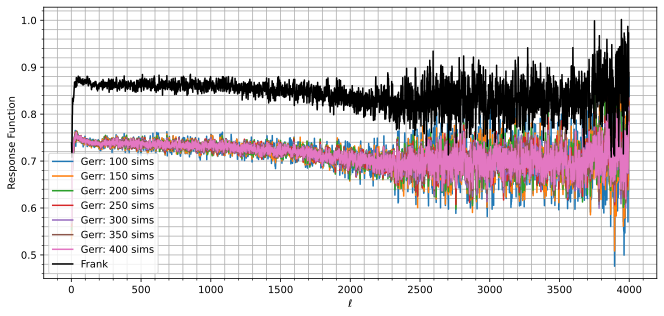

In [64]:
fig, ax = plt.subplots(1,1, figsize=(11,5))

#Plot Gerrit's R's
for Nsims, R_gerr_1d in R_gerr_1d_dict.items():
    ax.plot(R_gerr_1d[:-2], label=f'Gerr: {Nsims} sims')
    
#Plot Frank's R
ax.plot(R_v3_1d[:-2], color='black', label='Frank')

#Extras
ax.set_xlabel(r'$\ell$')
ax.set_ylabel('Response Function')
ax.grid(which='both')
ax.minorticks_on()
ax.legend();
# fig.savefig(PROJECT + 'v3_vs_Gerrit_1d.png', dpi=200, bbox_inches='tight');

# Smoothed Response Functions

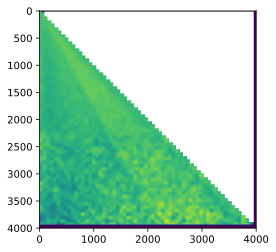

In [16]:
plt.imshow(R_smooth_64_list[0])

In [41]:
R = enmap.enmap(R_smooth_64_list[0])
B = R.downgrade(32, op=np.nanmean)
C = R.downgrade(64, op=np.nanmean)

/gpfs/fs1/home/r/rbond/ymehta3/.virtualenv/venv/lib/python3.9/site-packages/pixell/utils.py:1772: RuntimeWarning: Mean of empty slice
  if mid.size  > 0: parts.append(op(mid.reshape(mid.shape[:axis]+(nwhole,bsize)+mid.shape[axis+1:]),axis+1))


In [40]:

B == R.downgrade

True

In [14]:
R_smooth_32_list[0][-int(32/2 + 2):, 1000]

array([0.88537554, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ])

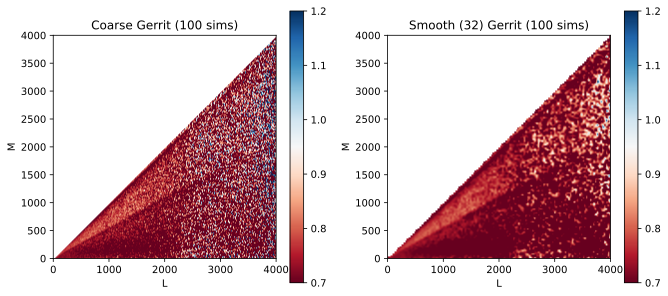

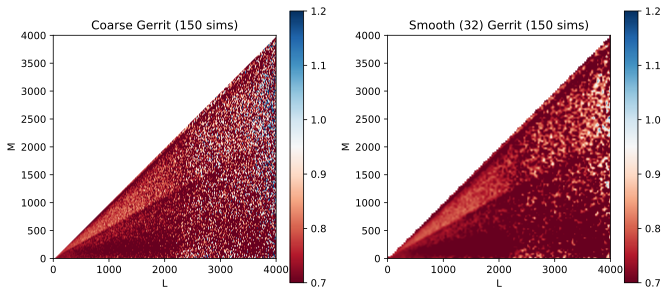

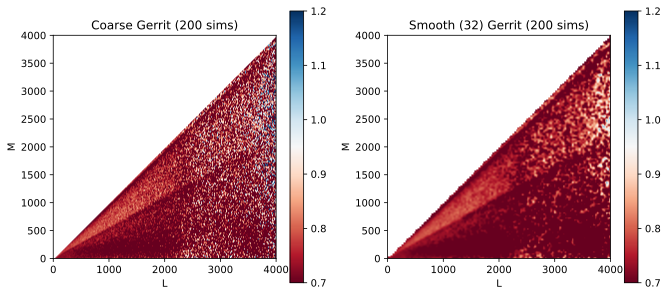

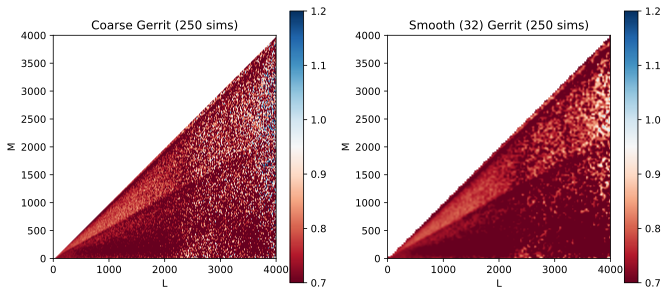

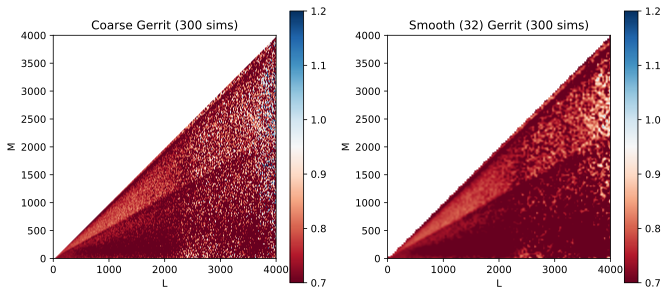

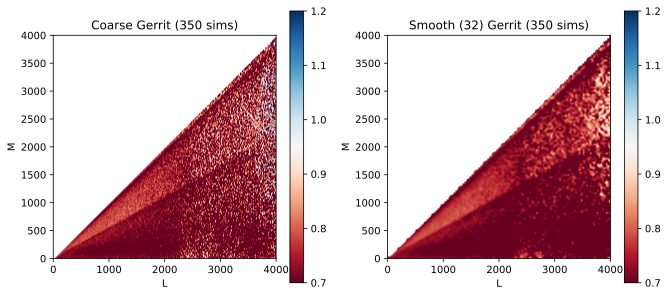

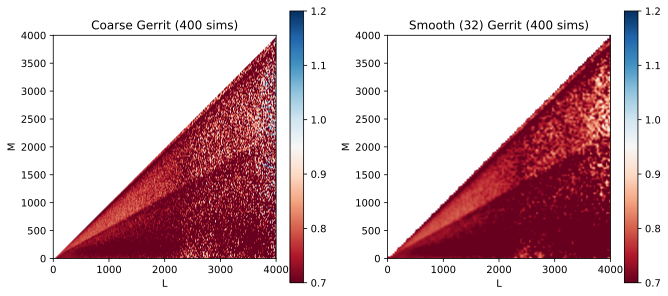

In [11]:
cbar_range = [0.7, 1.2]

for isim, R_gerr_coarse, R_gerr_smooth in zip(sims_list, R_gerr_list, R_smooth_32_list):
    fig, ax = plt.subplots(1,2, figsize=(11,5))

    im = ax[0].imshow(np.transpose(R_gerr_coarse), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    ax[0].set_title(f'Coarse Gerrit ({isim} sims)')
    plt.colorbar(im, ax=ax[0])

    im2 = ax[1].imshow(np.transpose(R_gerr_smooth), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[1].set_xlabel('L')
    ax[1].set_ylabel('M')
    ax[1].set_title(f'Smooth (32) Gerrit ({isim} sims)')
    plt.colorbar(im2, ax=ax[1]);

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

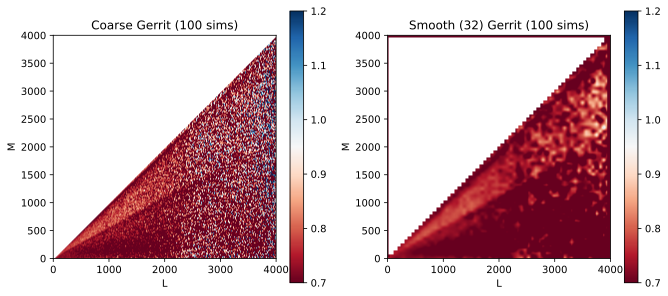

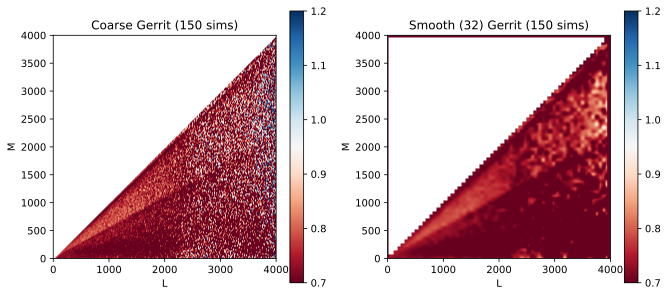

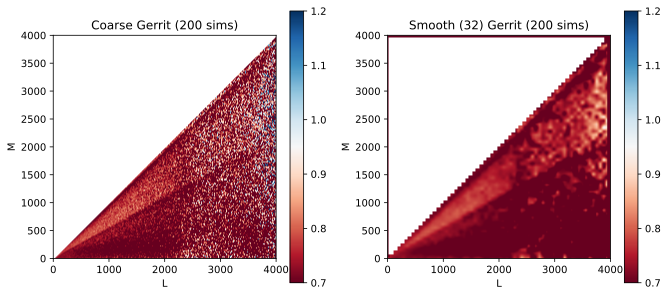

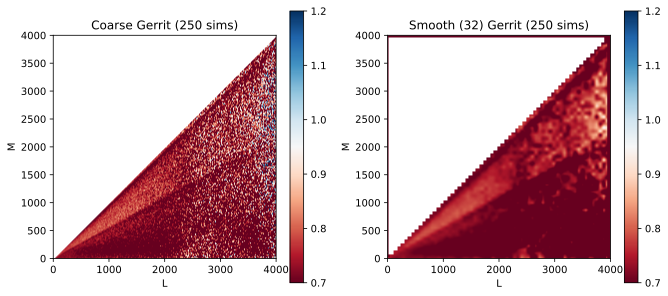

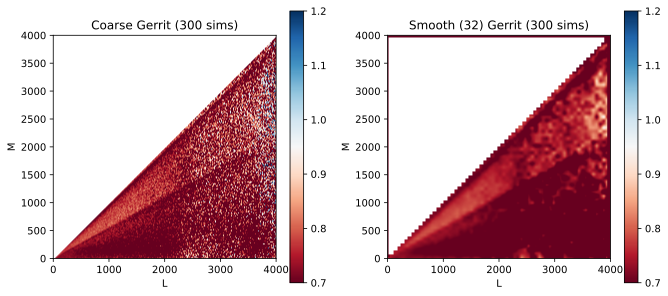

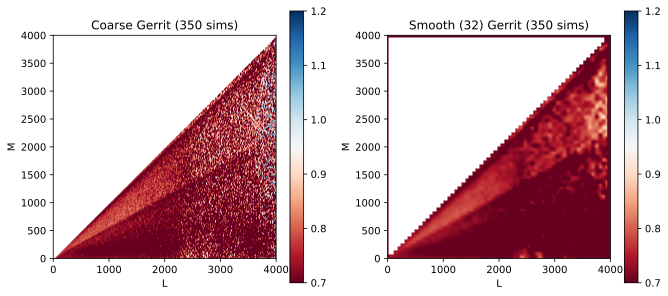

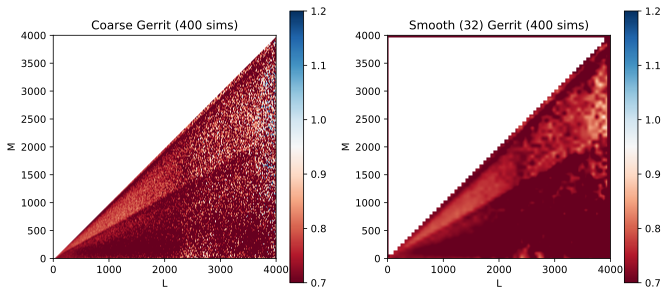

In [12]:
cbar_range = [0.7, 1.2]

for isim, R_gerr_coarse, R_gerr_smooth in zip(sims_list, R_gerr_list, R_smooth_64_list):
    fig, ax = plt.subplots(1,2, figsize=(11,5))

    im = ax[0].imshow(np.transpose(R_gerr_coarse), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    ax[0].set_title(f'Coarse Gerrit ({isim} sims)')
    plt.colorbar(im, ax=ax[0])

    im2 = ax[1].imshow(np.transpose(R_gerr_smooth), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[1].set_xlabel('L')
    ax[1].set_ylabel('M')
    ax[1].set_title(f'Smooth (64) Gerrit ({isim} sims)')
    plt.colorbar(im2, ax=ax[1]);

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

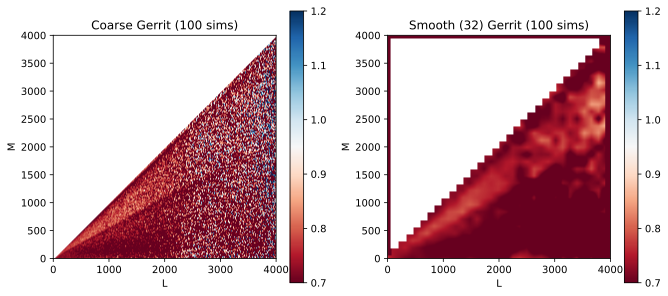

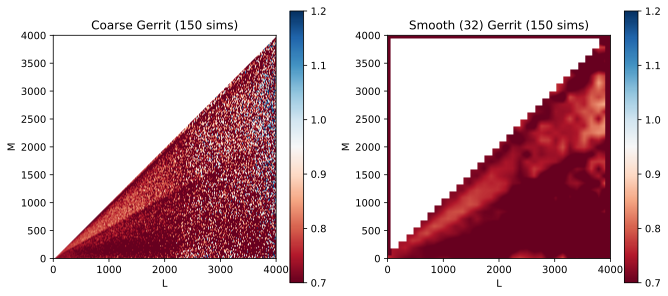

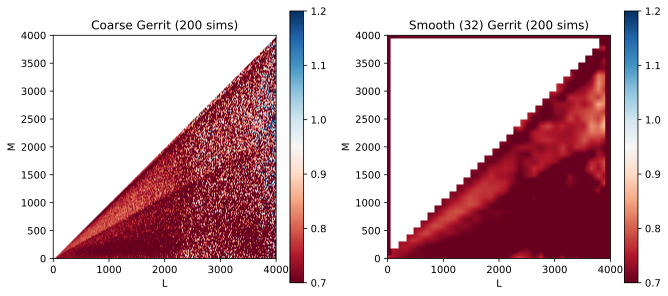

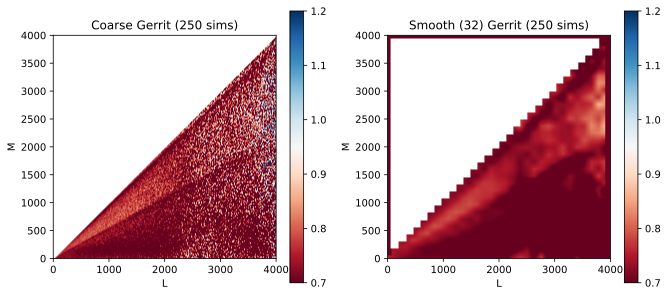

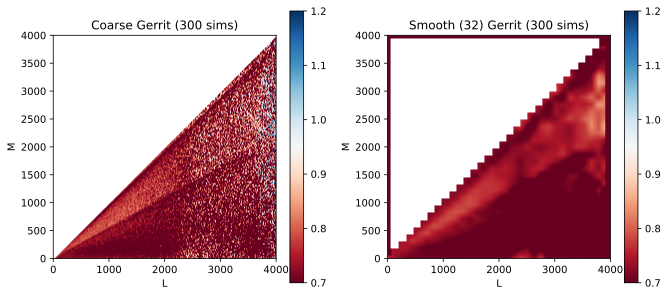

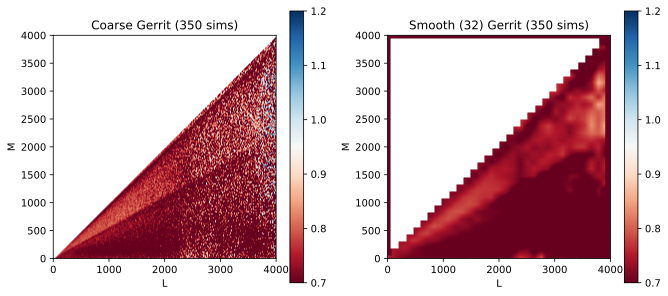

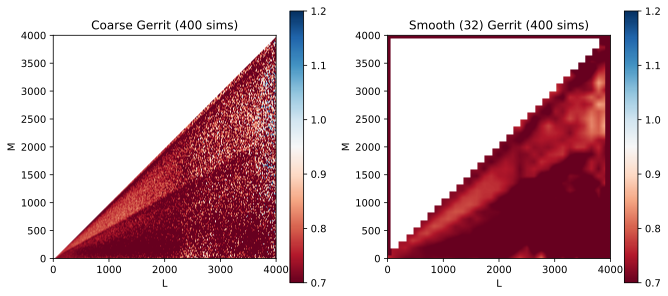

In [13]:
cbar_range = [0.7, 1.2]

for isim, R_gerr_coarse, R_gerr_smooth in zip(sims_list, R_gerr_list, R_smooth_128_list):
    fig, ax = plt.subplots(1,2, figsize=(11,5))

    im = ax[0].imshow(np.transpose(R_gerr_coarse), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    ax[0].set_title(f'Coarse Gerrit ({isim} sims)')
    plt.colorbar(im, ax=ax[0])

    im2 = ax[1].imshow(np.transpose(R_gerr_smooth), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[1].set_xlabel('L')
    ax[1].set_ylabel('M')
    ax[1].set_title(f'Smooth (128) Gerrit ({isim} sims)')
    plt.colorbar(im2, ax=ax[1]);

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

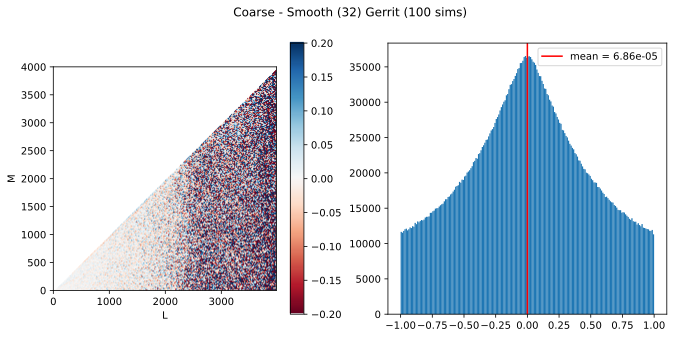

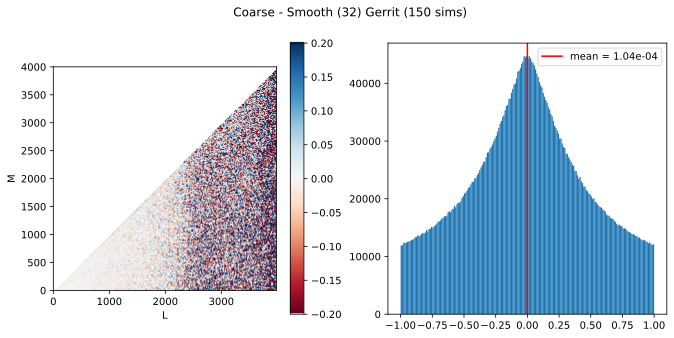

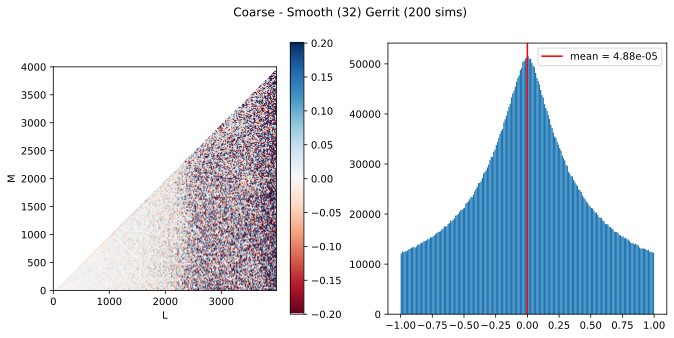

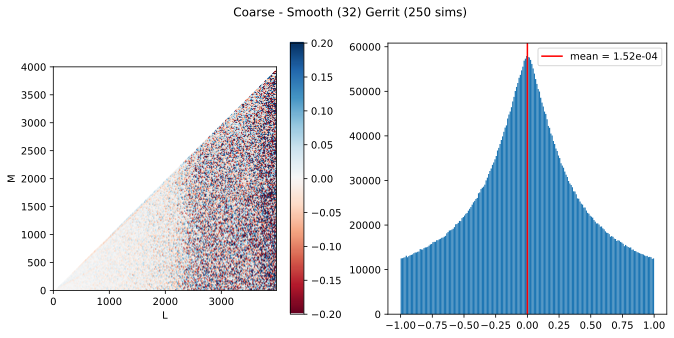

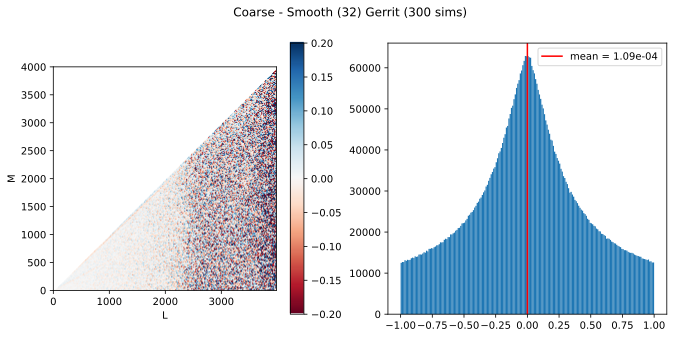

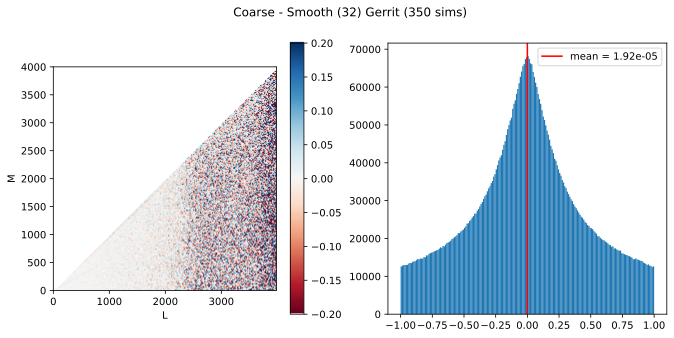

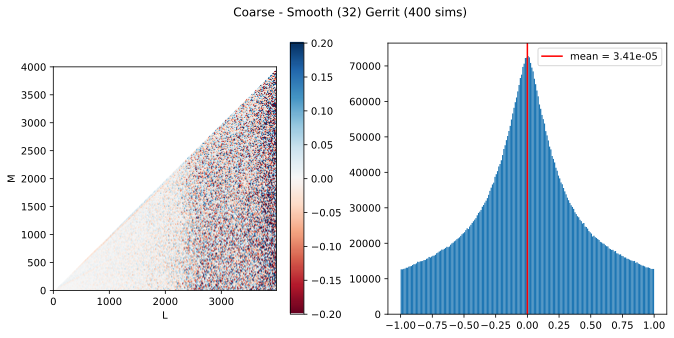

In [38]:
cbar_range = [-0.2, 0.2]

for isim, R_gerr_coarse, R_gerr_smooth in zip(sims_list, R_gerr_list, R_smooth_32_list):
    fig, ax = plt.subplots(1,2, figsize=(11,5))

    R_null = R_gerr_coarse - R_gerr_smooth
    R_null = R_null[:ellcut_32, :]
    mean_null = np.nanmean(R_null)
    
    im = ax[0].imshow(np.transpose(R_null), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    plt.colorbar(im, ax=ax[0]);

    ax[1].hist(R_null[~np.isnan(R_null)], bins=200, range= [-1, 1])
    ax[1].axvline(mean_null, color='red', label=f'mean = {mean_null:.2e}')
    ax[1].legend()
    
    fig.suptitle(f'Coarse - Smooth (32) Gerrit ({isim} sims)')
    

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

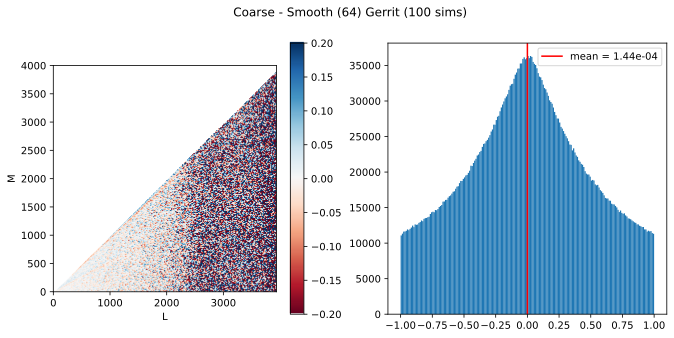

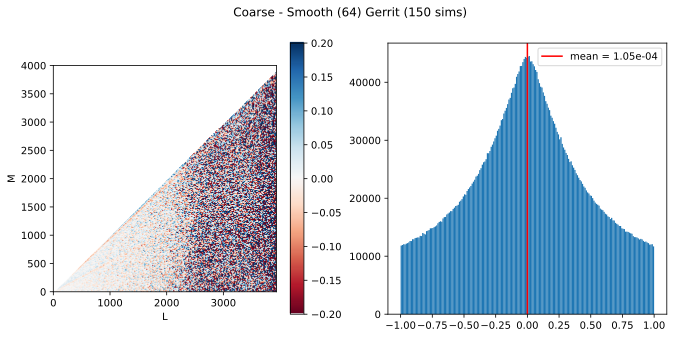

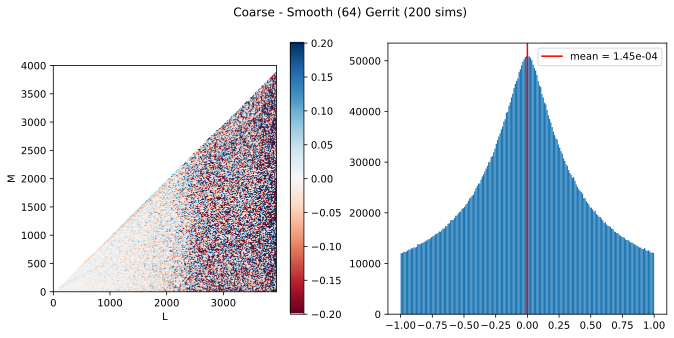

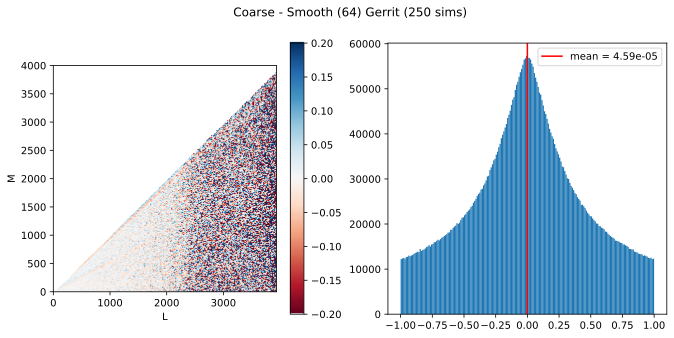

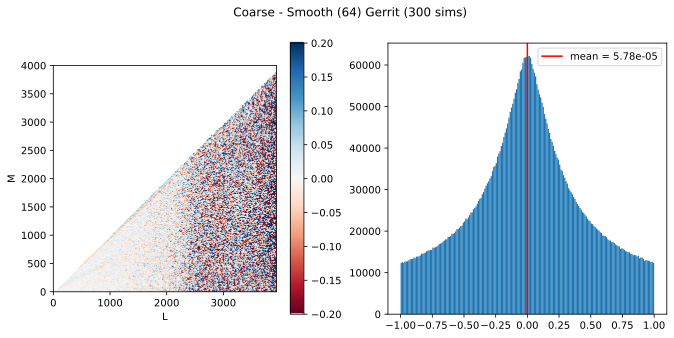

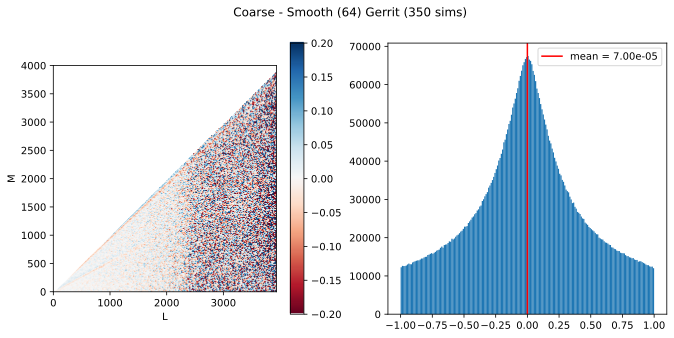

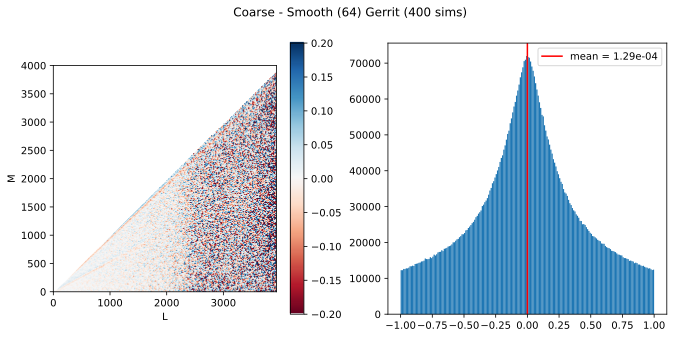

In [39]:
cbar_range = [-0.2, 0.2]

for isim, R_gerr_coarse, R_gerr_smooth in zip(sims_list, R_gerr_list, R_smooth_64_list):
    fig, ax = plt.subplots(1,2, figsize=(11,5))

    R_null = R_gerr_coarse - R_gerr_smooth
    R_null = R_null[:ellcut_64, :]
    mean_null = np.nanmean(R_null)
    
    im = ax[0].imshow(np.transpose(R_null), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    plt.colorbar(im, ax=ax[0]);

    ax[1].hist(R_null[~np.isnan(R_null)], bins=200, range= [-1, 1])
    ax[1].axvline(mean_null, color='red', label=f'mean = {mean_null:.2e}')
    ax[1].legend()
    
    fig.suptitle(f'Coarse - Smooth (64) Gerrit ({isim} sims)')
    

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

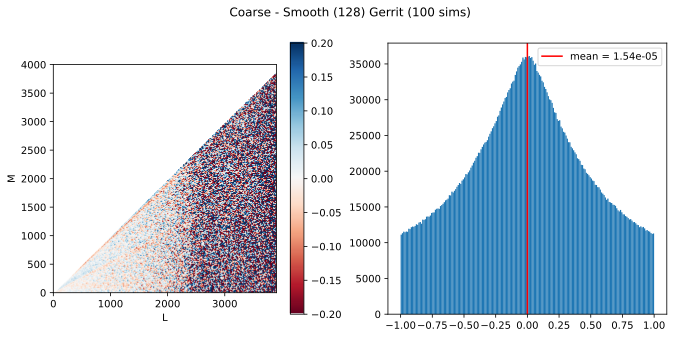

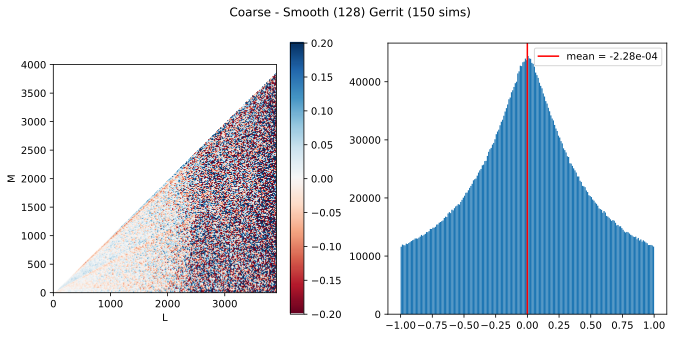

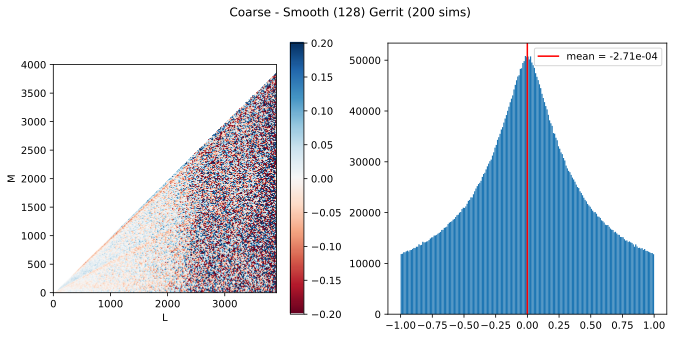

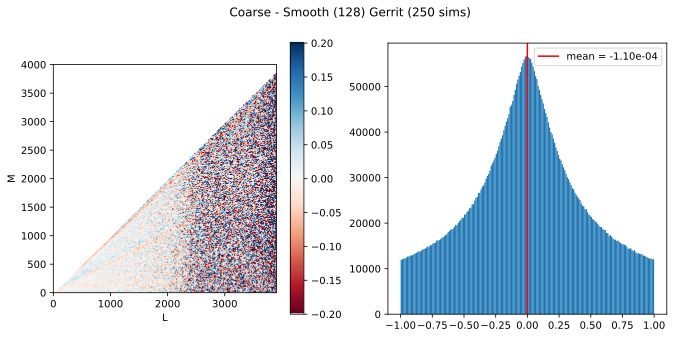

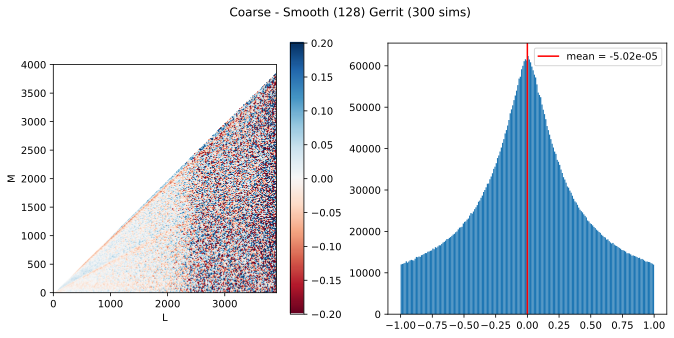

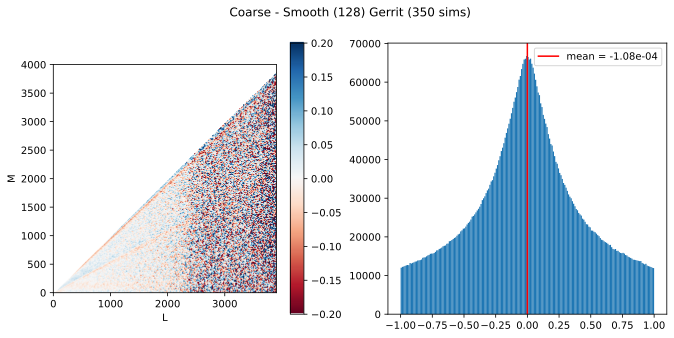

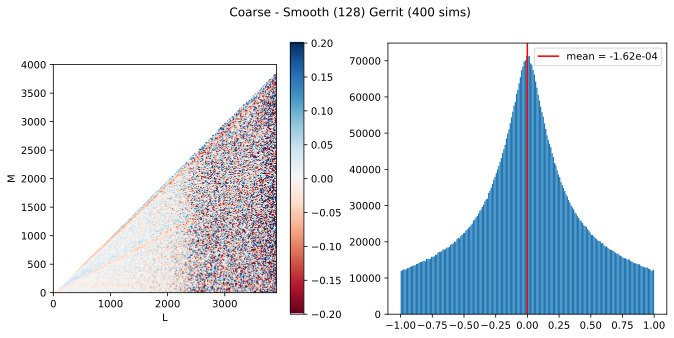

In [40]:
cbar_range = [-0.2, 0.2]

for isim, R_gerr_coarse, R_gerr_smooth in zip(sims_list, R_gerr_list, R_smooth_128_list):
    fig, ax = plt.subplots(1,2, figsize=(11,5))

    R_null = R_gerr_coarse - R_gerr_smooth
    R_null = R_null[:ellcut_128, :]
    mean_null = np.nanmean(R_null)
    
    im = ax[0].imshow(np.transpose(R_null), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    plt.colorbar(im, ax=ax[0]);

    ax[1].hist(R_null[~np.isnan(R_null)], bins=200, range= [-1, 1])
    ax[1].axvline(mean_null, color='red', label=f'mean = {mean_null:.2e}')
    ax[1].legend()
    
    fig.suptitle(f'Coarse - Smooth (128) Gerrit ({isim} sims)')
    

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

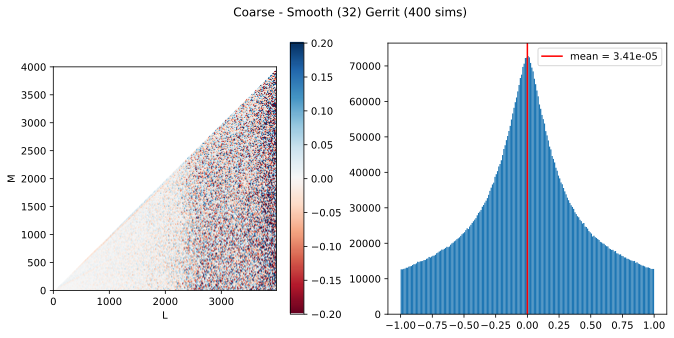

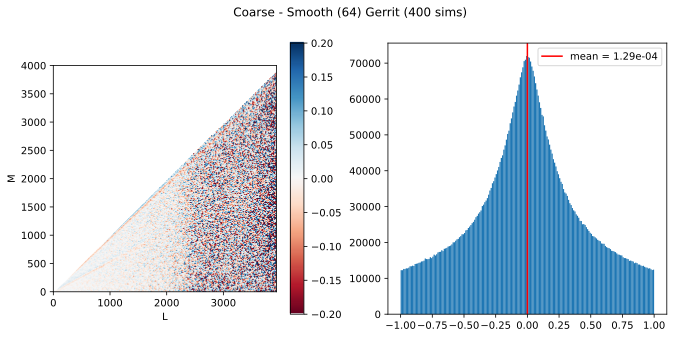

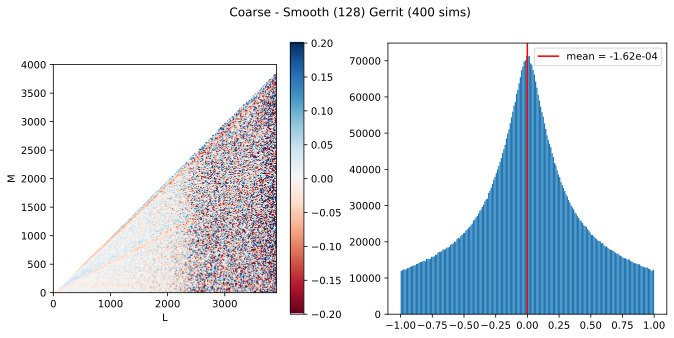

In [48]:
cbar_range = [-0.2, 0.2]

for i, R_gerr_smooth in enumerate([R_smooth_32_list[-1], R_smooth_64_list[-1], R_smooth_128_list[-1]]):
    fig, ax = plt.subplots(1,2, figsize=(11,5))
    
    R_null = R_gerr_list[-1] - R_gerr_smooth
    R_null = R_null[:ellcut_list[i], :]
    mean_null = np.nanmean(R_null)
    
    im = ax[0].imshow(np.transpose(R_null), clim=cbar_range, cmap='RdBu', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    plt.colorbar(im, ax=ax[0]);

    ax[1].hist(R_null[~np.isnan(R_null)], bins=200, range= [-1, 1])
    ax[1].axvline(mean_null, color='red', label=f'mean = {mean_null:.2e}')
    ax[1].legend()
    
    fig.suptitle(f'Coarse - Smooth ({factor_list[i]}) Gerrit ({sims_list[-1]} sims)')
    

# fig.savefig(PLOTDIR + 'R2_coarse_vs.png', bbox_inches='tight', dpi=400);

The good news is that the means are basically 0 and the fluctuations aren't as big compared to the coarse histograms above, so the smoothed versions capture most of the information and the rest is just noise. However, the greater the smoothing, the more fine detail remains. Is there enough residual information not captured in the smoothed versions to care about?

# Kappa Auto Weights and Smoothed Response Function

In [25]:
W2_32_list = []

for var in var_32_list:
    W2 = 1 / np.array(var)**2
    norm = np.nansum(2 * W2[:, 1:], axis=-1) + W2[:, 0]
    W2_32_list.append(W2 / norm[...,None])

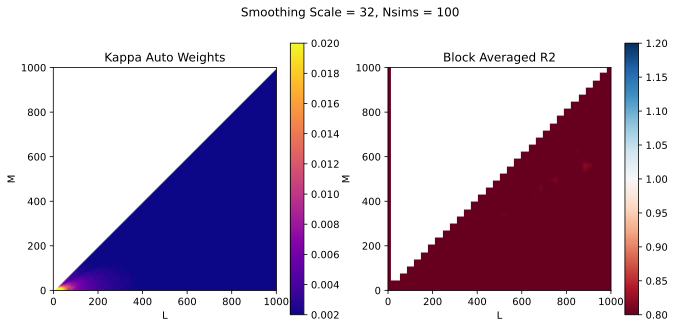

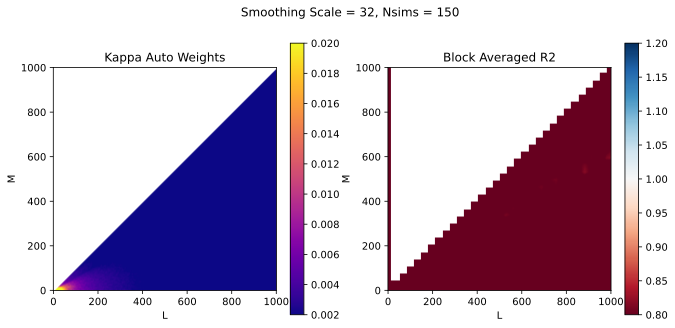

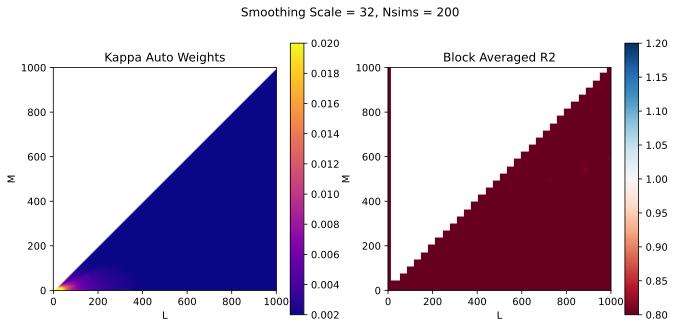

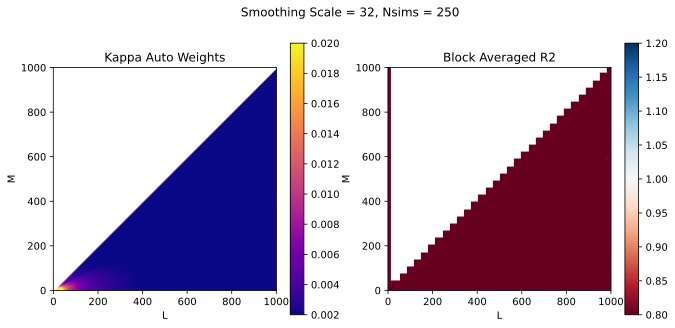

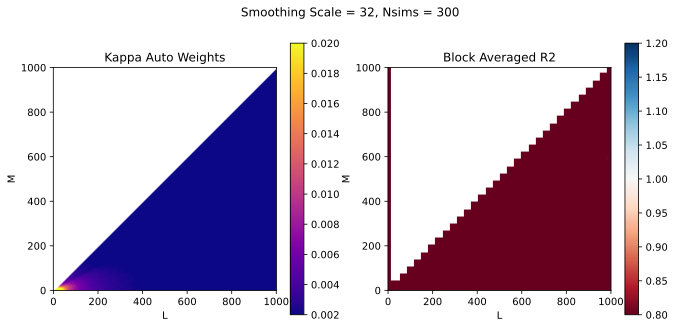

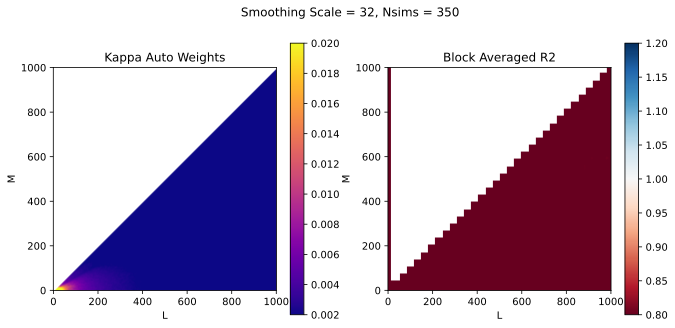

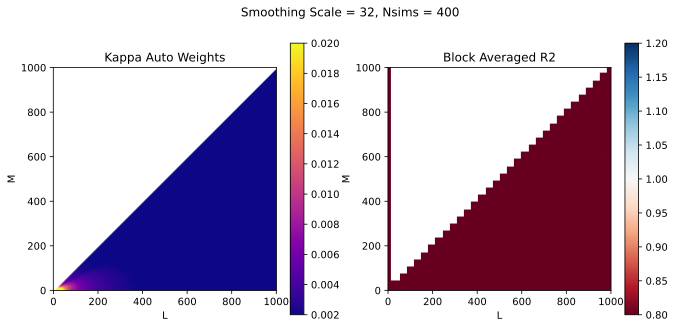

In [32]:
cbar_range1 = [2e-3, 2e-2]
cbar_range2 = [0.8, 1.2]

for nsims, W2, R_smooth in zip(sims_list, W2_32_list, R_smooth_32_list):  
    fig, ax = plt.subplots(1,2, figsize=(11,5))
    
    im1 = ax[0].imshow(np.transpose(W2), clim= cbar_range1, cmap='plasma', origin='lower')
    ax[0].set_xlabel('L')
    ax[0].set_ylabel('M')
    ax[0].set_title(f'Kappa Auto Weights')
    plt.colorbar(im1, ax=ax[0])
    
    im2 = ax[1].imshow(np.transpose(R_smooth[:1001, :1001]), clim=cbar_range2, cmap='RdBu', origin='lower')
    ax[1].set_xlabel('L')
    ax[1].set_ylabel('M')
    ax[1].set_title('Block Averaged R2')
    plt.colorbar(im2, ax=ax[1])
    
    fig.suptitle(f'Smoothing Scale = 32, Nsims = {nsims}');

In [26]:
W2_64_list = []

for var in var_64_list:
    W2 = 1 / np.array(var)**2
    norm = np.nansum(2 * W2[:, 1:], axis=-1) + W2[:, 0]
    W2_64_list.append(W2 / norm[...,None])

In [27]:
W2_128_list = []

for var in var_128_list:
    W2 = 1 / np.array(var)**2
    norm = np.nansum(2 * W2[:, 1:], axis=-1) + W2[:, 0]
    W2_128_list.append(W2 / norm[...,None])